#PART 1

In [1]:
import torch
import torchvision
import torchvision.transforms as transforms
import torch.nn.functional as F
from torch.utils.data import DataLoader
import json
import os
from tqdm import tqdm
import numpy as np
import warnings
warnings.filterwarnings("ignore")

In [2]:
# Load ResNet-34 pretrained on ImageNet-1K
resnet34 = torchvision.models.resnet34(weights='IMAGENET1K_V1')
resnet34.eval().cuda()

# Load label map to map indices
with open("/content/drive/MyDrive/TestDataSet/TestDataSet/labels_list.json", "r") as f:
    labels = json.load(f)
# Extract the integer label index from each entry
imagenet_indices = [int(l.split(":")[0]) for l in labels]

# Image preprocessing
mean_norms = np.array([0.485, 0.456, 0.406])
std_norms = np.array([0.229, 0.224, 0.225])
plain_transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=mean_norms, std=std_norms)
])

# Dataset and DataLoader
dataset = torchvision.datasets.ImageFolder(root="/content/drive/MyDrive/TestDataSet/TestDataSet", transform=plain_transforms)
loader = DataLoader(dataset, batch_size=64, shuffle=False, num_workers=4)

Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 143MB/s]


In [3]:
# Evaluation loop
top1_correct = 0
top5_correct = 0
total = 0

with torch.no_grad():
    for images, targets in tqdm(loader):
        images = images.cuda()
        targets = targets.cuda()

        outputs = resnet34(images)  # [B, 1000]
        # Mask output to only the 100 target class indices
        masked_outputs = outputs[:, imagenet_indices]

        _, top5 = masked_outputs.topk(5, dim=1)  # [B, 5]
        top1 = top5[:, 0]  # [B]

        top1_correct += (top1 == targets).sum().item()
        top5_correct += sum([targets[i] in top5[i] for i in range(len(targets))])
        total += targets.size(0)

top1_acc = top1_correct / total
top5_acc = top5_correct / total

print(f"Top-1 Accuracy: {top1_acc * 100:.2f}%")
print(f"Top-5 Accuracy: {top5_acc * 100:.2f}%")


100%|██████████| 8/8 [01:02<00:00,  7.76s/it]

Top-1 Accuracy: 89.60%
Top-5 Accuracy: 99.40%


#PART 2

Running FGSM attack on dataset...


100%|██████████| 500/500 [03:41<00:00,  2.26it/s]


✔️ FGSM adversarial images generated.

🔍 Visualizing misclassified adversarial samples:


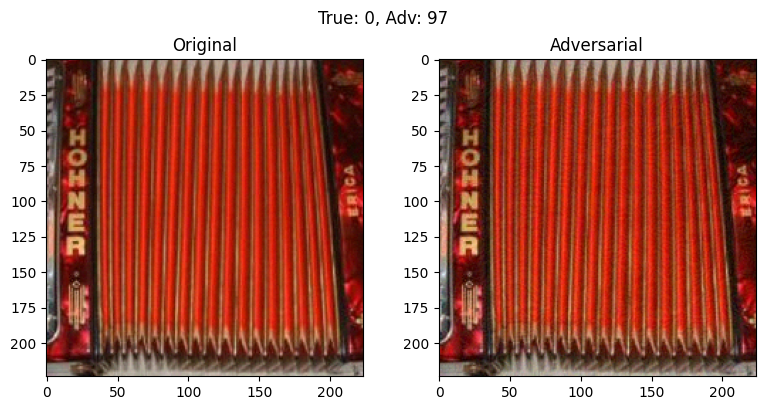

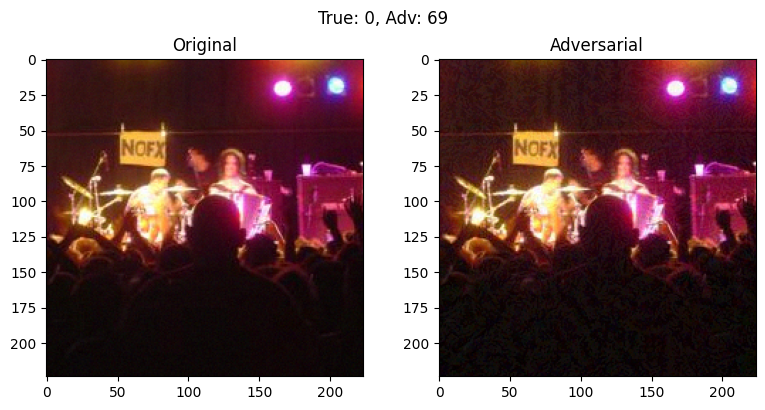

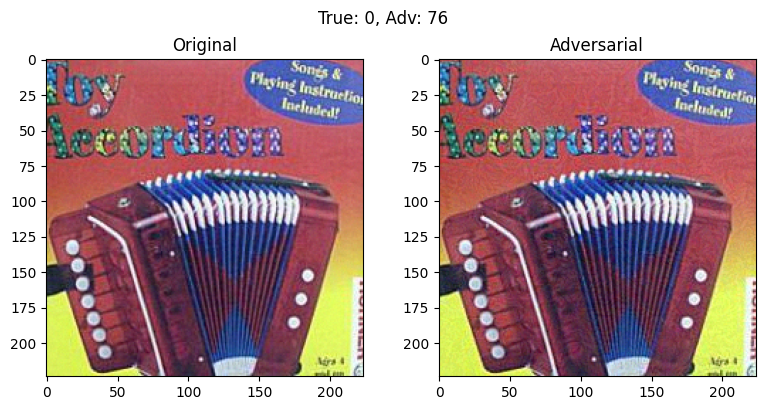

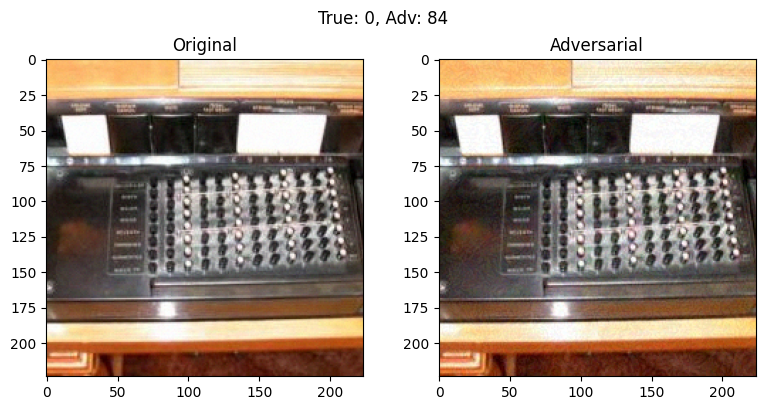

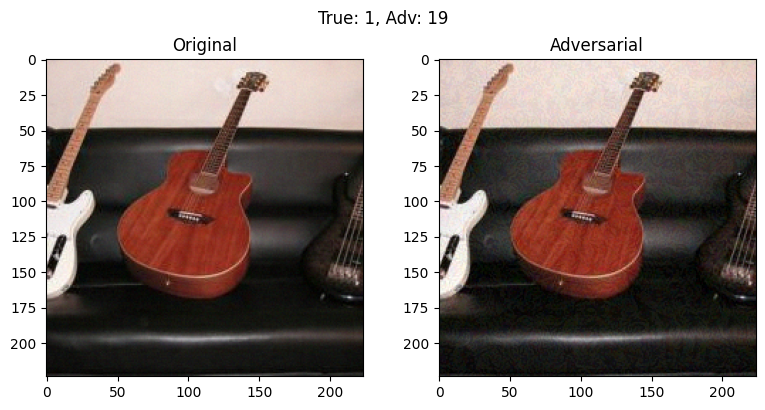


📊 Evaluating accuracy on adversarial test set...

✅ FGSM Evaluation on Adversarial Set (ε = 0.02)
Top-1 Accuracy: 7.00%
Top-5 Accuracy: 34.40%


In [4]:
import torch
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np
import json
import os
from tqdm import tqdm
from torchvision.utils import save_image
from PIL import Image
from torch.utils.data import DataLoader

# Load model
model = torchvision.models.resnet34(weights='IMAGENET1K_V1').cuda().eval()

# Load label indices from labelslist.json
with open("/content/drive/MyDrive/TestDataSet/TestDataSet/labels_list.json", "r") as f:
    labels = json.load(f)
imagenet_indices = [int(x.split(":")[0]) for x in labels]

# Normalization params
mean_norms = np.array([0.485, 0.456, 0.406])
std_norms = np.array([0.229, 0.224, 0.225])
normalize = transforms.Normalize(mean=mean_norms, std=std_norms)
unnormalize = transforms.Normalize(mean=-mean_norms / std_norms, std=1 / std_norms)

# Original image loader
to_tensor = transforms.ToTensor()

# FGSM params
epsilon = 0.02  # In raw pixel space, [0,1] range

# Dataset setup
root = "/content/drive/MyDrive/TestDataSet/TestDataSet"
dataset = torchvision.datasets.ImageFolder(root=root, transform=lambda x: x)  # No transform here

# Output dir
adv_save_dir = "/content/drive/MyDrive/Adversarial_Test_Set_1"
os.makedirs(adv_save_dir, exist_ok=True)

adv_images = []
orig_images = []
true_labels = []
adv_labels = []

print("Running FGSM attack on dataset...")

for i, (img_pil, label) in enumerate(tqdm(dataset)):
    # raw_tensor_perturbed = to_tensor(img_pil).unsqueeze(0).cuda().requires_grad_(True)
    # norm_tensor = normalize(raw_tensor_perturbed)

    raw_tensor = to_tensor(img_pil).unsqueeze(0).cuda()
    delta = torch.empty_like(raw_tensor).uniform_(-epsilon, epsilon).cuda()
    raw_tensor_perturbed = torch.clamp(raw_tensor + delta, -1, 1).requires_grad_(True)
    norm_tensor = normalize(raw_tensor_perturbed)


    output = model(norm_tensor)
    masked_output = output[:, imagenet_indices]
    # masked_output = output

    loss = torch.nn.functional.cross_entropy(masked_output, torch.tensor([label]).cuda())

    model.zero_grad()
    loss.backward()

    sign_grad = raw_tensor_perturbed.grad.sign()
    adv_raw = raw_tensor_perturbed + epsilon * sign_grad
    adv_raw = torch.clamp(adv_raw, -1, 1)
    adv_norm = normalize(adv_raw)

    # Save adv image
    save_path = os.path.join(adv_save_dir, f"adv_{i:04d}.png")
    save_image(adv_raw.squeeze().cpu(), save_path)

    # Log for evaluation
    with torch.no_grad():
        pred = model(adv_norm)
        masked_pred = pred[:, imagenet_indices]
        pred_top1 = masked_pred.argmax(dim=1)

        adv_images.append(adv_norm.cpu())
        orig_images.append(norm_tensor.cpu())
        true_labels.append(label)
        adv_labels.append(pred_top1.item())

print("✔️ FGSM adversarial images generated.")

# Stack for batch eval
adv_images = torch.cat(adv_images)
orig_images = torch.cat(orig_images)
true_labels = torch.tensor(true_labels)
adv_labels = torch.tensor(adv_labels)

# Visualize some misclassifications
print("\n🔍 Visualizing misclassified adversarial samples:")
misclassified = (adv_labels != true_labels).nonzero(as_tuple=True)[0]
for i in misclassified[:5]:
    orig = unnormalize(orig_images[i]).permute(1, 2, 0).numpy()
    adv = unnormalize(adv_images[i]).permute(1, 2, 0).numpy()

    fig, axs = plt.subplots(1, 2, figsize=(8, 4))
    axs[0].imshow(np.clip(orig, 0, 1))
    axs[0].set_title("Original")
    axs[1].imshow(np.clip(adv, 0, 1))
    axs[1].set_title("Adversarial")
    plt.suptitle(f"True: {true_labels[i].item()}, Adv: {adv_labels[i].item()}")
    plt.tight_layout()
    plt.show()

# Evaluation on adversarial images
print("\n📊 Evaluating accuracy on adversarial test set...")

top1_correct, top5_correct = 0, 0
total = 0

model.eval()
with torch.no_grad():
    for i in range(0, len(adv_images), 64):
        batch = adv_images[i:i+64].cuda()
        targets = true_labels[i:i+64].cuda()
        outputs = model(batch)
        masked_outputs = outputs[:, imagenet_indices]

        _, top5 = masked_outputs.topk(5, dim=1)
        top1 = top5[:, 0]

        top1_correct += (top1 == targets).sum().item()
        top5_correct += sum([targets[j] in top5[j] for j in range(len(targets))])
        total += targets.size(0)

adv_top1_acc = top1_correct / total
adv_top5_acc = top5_correct / total

print(f"\n✅ FGSM Evaluation on Adversarial Set (ε = {epsilon})")
print(f"Top-1 Accuracy: {adv_top1_acc * 100:.2f}%")
print(f"Top-5 Accuracy: {adv_top5_acc * 100:.2f}%")



🔍 Visualizing misclassified adversarial samples with perturbation analysis:


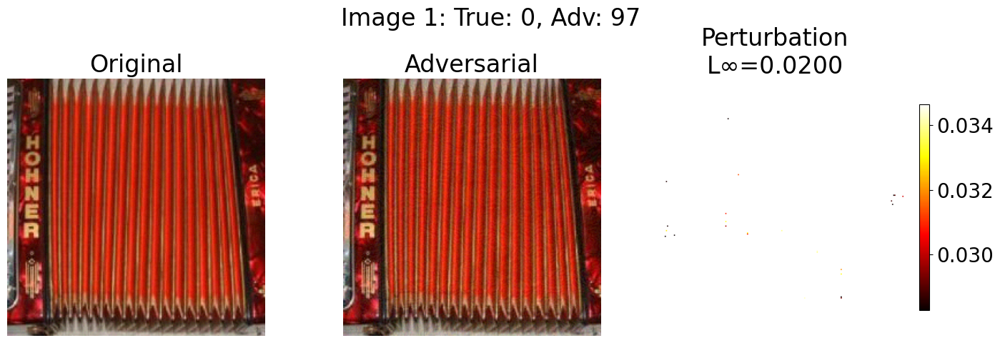

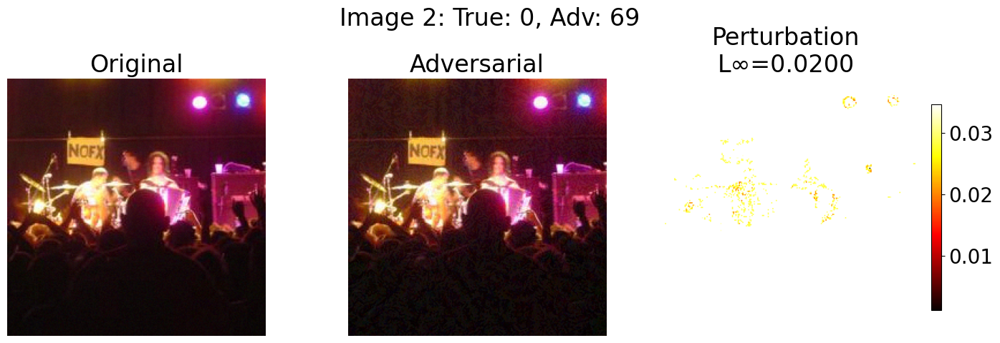

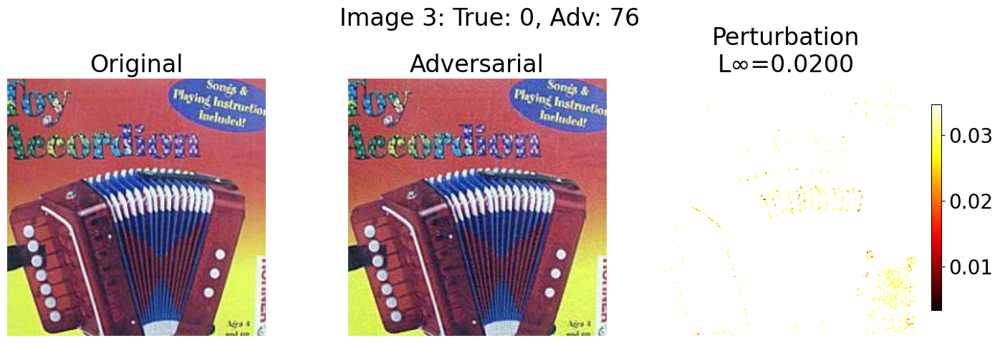

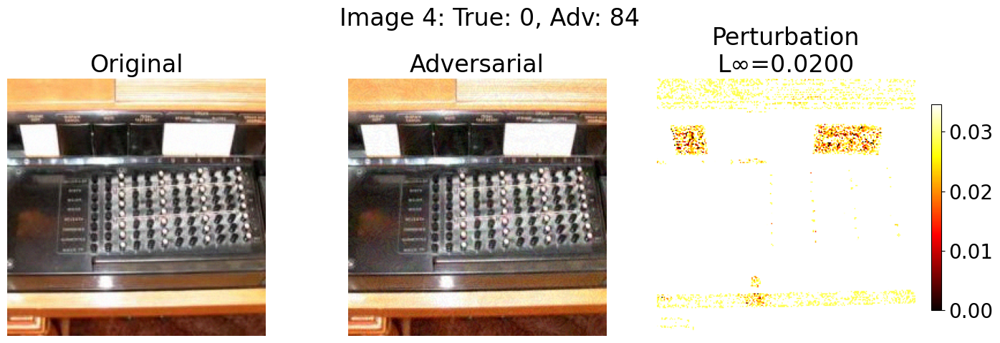

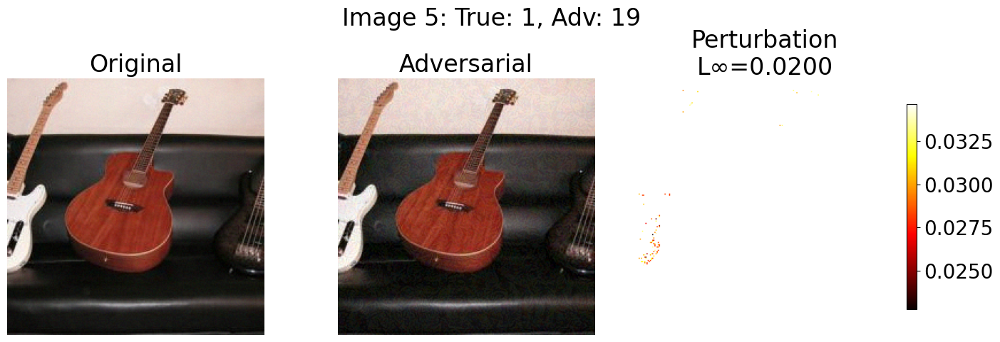

In [5]:
# Visualize misclassifications with perturbation analysis
print("\n🔍 Visualizing misclassified adversarial samples with perturbation analysis:")
misclassified = (adv_labels != true_labels).nonzero(as_tuple=True)[0]

# Set up matplotlib parameters for larger fonts
plt.rcParams.update({'font.size': 20})

# Create directory for saving plots
save_dir = "/content/drive/MyDrive/perturbation_analysis"
os.makedirs(save_dir, exist_ok=True)

for i, idx in enumerate(misclassified[:5]):
    orig = unnormalize(orig_images[idx]).permute(1, 2, 0).numpy()
    adv = unnormalize(adv_images[idx]).permute(1, 2, 0).numpy()

    # Calculate perturbation and L_inf norm
    perturbation = adv - orig
    l_inf_norm = np.max(np.abs(perturbation))

    # Calculate perturbation magnitude (pixel-wise L2 norm across channels)
    perturbation_magnitude = np.sqrt(np.sum(perturbation**2, axis=2))

    # Create figure with 3 subplots
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))

    # Plot original
    axs[0].imshow(np.clip(orig, 0, 1))
    axs[0].set_title("Original")
    axs[0].axis('off')  # Remove axes for cleaner look

    # Plot adversarial
    axs[1].imshow(np.clip(adv, 0, 1))
    axs[1].set_title("Adversarial")
    axs[1].axis('off')

    # Plot perturbation heatmap
    perturbation_img = axs[2].imshow(perturbation_magnitude, cmap='hot')
    axs[2].set_title(f"Perturbation\nL∞={l_inf_norm:.4f}")
    axs[2].axis('off')
    fig.colorbar(perturbation_img, ax=axs[2], shrink=0.8)

    plt.suptitle(f"Image {i+1}: True: {true_labels[idx].item()}, Adv: {adv_labels[idx].item()}")

    # Tight layout with minimal white space
    plt.tight_layout()
    plt.subplots_adjust(wspace=0.05)

    # Save as PNG and PDF with minimal white space
    plt.savefig(f"{save_dir}/perturbation_analysis_{i+1}.png", bbox_inches='tight', dpi=300)
    plt.savefig(f"{save_dir}/perturbation_analysis_{i+1}.pdf", bbox_inches='tight')

    plt.show()

#PART 3

100%|██████████| 500/500 [15:23<00:00,  1.85s/it]



🔍 Visualizing PGD misclassified samples:


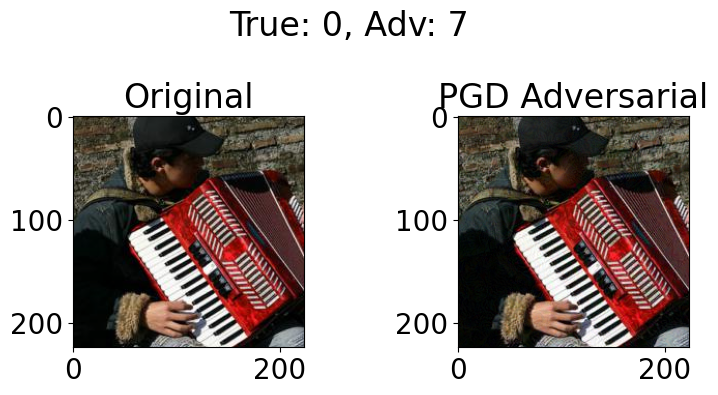

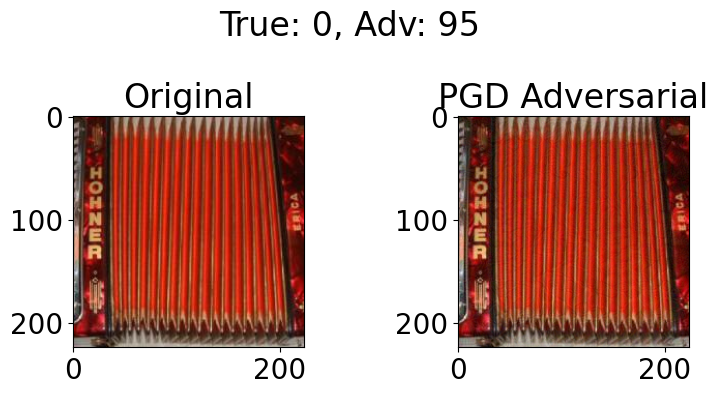

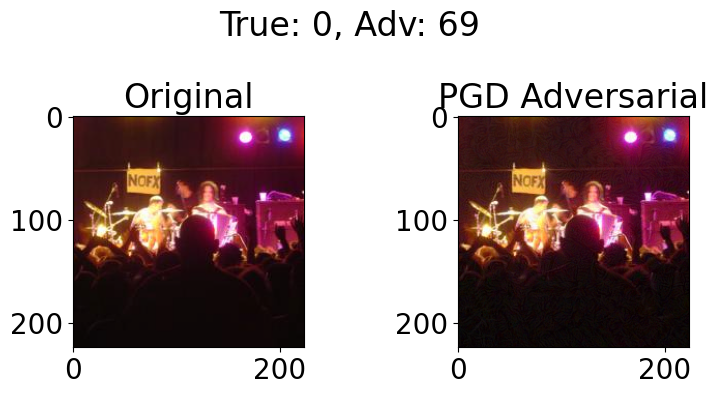

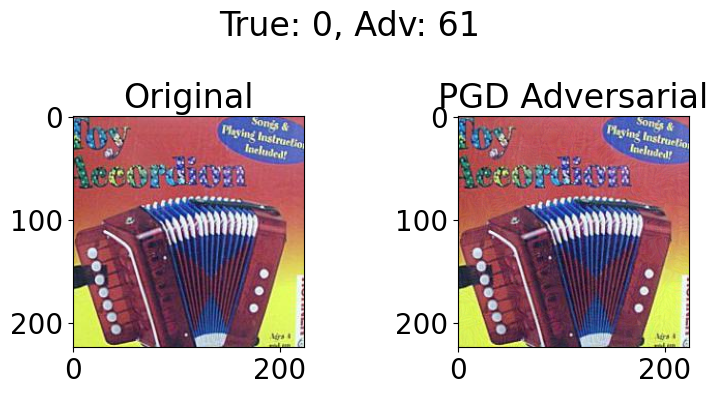

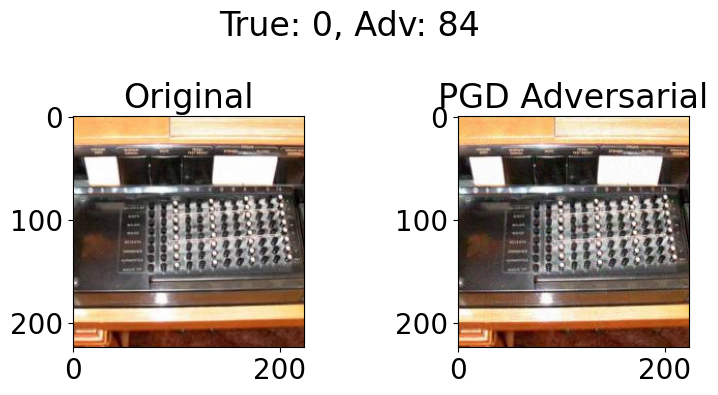


📊 Evaluating accuracy on adversarial test set...

✅ PGD Evaluation on Adversarial Set 2 (ε = 0.02)
Top-1 Accuracy: 0.00%
Top-5 Accuracy: 2.40%


In [6]:
import torch
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np
import json
import os
from tqdm import tqdm
from torchvision.utils import save_image
from PIL import Image
from torch.utils.data import DataLoader

# Load model
model = torchvision.models.resnet34(weights='IMAGENET1K_V1').cuda().eval()

# Load label indices from labelslist.json
with open("/content/drive/MyDrive/TestDataSet/TestDataSet/labels_list.json", "r") as f:
    labels = json.load(f)
imagenet_indices = [int(x.split(":")[0]) for x in labels]

# Normalization utilities
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])
normalize = transforms.Normalize(mean=mean, std=std)
unnormalize = transforms.Normalize(mean=-mean / std, std=1 / std)

to_tensor = transforms.ToTensor()
epsilon = 0.02
alpha = 0.01  # step size
num_steps = 100

# Dataset setup
root = "/content/drive/MyDrive/TestDataSet/TestDataSet"
dataset = torchvision.datasets.ImageFolder(root=root, transform=lambda x: x)

# Output dir
adv_save_dir = "/content/drive/MyDrive/Adversarial_Test_Set_2"
os.makedirs(adv_save_dir, exist_ok=True)

adv_images = []
orig_images = []
true_labels = []
adv_labels = []

for i, (img_pil, label) in enumerate(tqdm(dataset)):
    raw = to_tensor(img_pil).unsqueeze(0).cuda()
    orig = raw.clone()
    raw.requires_grad = True

    # Random start within epsilon ball
    perturbed = orig + (torch.empty_like(orig).uniform_(-epsilon, epsilon))
    perturbed = torch.clamp(perturbed, 0, 1).detach().requires_grad_(True)

    for _ in range(num_steps):  # increased from 50 to 100
        normed = normalize(perturbed)
        output = model(normed)
        loss = torch.nn.functional.cross_entropy(output[:, imagenet_indices], torch.tensor([label]).cuda())

        model.zero_grad()
        loss.backward()

        grad = perturbed.grad
        perturbed = perturbed + alpha * grad.sign()
        delta = torch.clamp(perturbed - orig, min=-epsilon, max=epsilon)
        perturbed = torch.clamp(orig + delta, 0, 1).detach().requires_grad_(True)


    # Save image
    save_path = os.path.join(adv_save_dir, f"adv_{i:04d}.png")
    save_image(perturbed.detach().cpu().squeeze(), save_path)

    # Evaluation
    normed_adv = normalize(perturbed.detach())
    with torch.no_grad():
        pred = model(normed_adv)
        masked_pred = pred[:, imagenet_indices]
        pred_top1 = masked_pred.argmax(dim=1)

        adv_images.append(normed_adv.cpu())
        orig_images.append(normalize(orig).cpu())
        true_labels.append(label)
        adv_labels.append(pred_top1.item())

# Stack tensors for eval
adv_images = torch.cat(adv_images)
orig_images = torch.cat(orig_images)
true_labels = torch.tensor(true_labels)
adv_labels = torch.tensor(adv_labels)

# Visualize misclassified images
print("\n🔍 Visualizing PGD misclassified samples:")
misclassified = (adv_labels != true_labels).nonzero(as_tuple=True)[0]
for i in misclassified[:5]:
    orig = unnormalize(orig_images[i]).permute(1, 2, 0).numpy()
    adv = unnormalize(adv_images[i]).permute(1, 2, 0).numpy()

    fig, axs = plt.subplots(1, 2, figsize=(8, 4))
    axs[0].imshow(np.clip(orig, 0, 1))
    axs[0].set_title("Original")
    axs[1].imshow(np.clip(adv, 0, 1))
    axs[1].set_title("PGD Adversarial")
    plt.suptitle(f"True: {true_labels[i].item()}, Adv: {adv_labels[i].item()}")
    plt.tight_layout()
    plt.show()

# Evaluation
print("\n📊 Evaluating accuracy on adversarial test set...")

top1_correct, top5_correct = 0, 0
total = 0

with torch.no_grad():
    for i in range(0, len(adv_images), 64):
        batch = adv_images[i:i+64].cuda()
        targets = true_labels[i:i+64].cuda()
        outputs = model(batch)
        masked_outputs = outputs[:, imagenet_indices]

        _, top5 = masked_outputs.topk(5, dim=1)
        top1 = top5[:, 0]

        top1_correct += (top1 == targets).sum().item()
        top5_correct += sum([targets[j] in top5[j] for j in range(len(targets))])
        total += targets.size(0)

adv_top1_acc = top1_correct / total
adv_top5_acc = top5_correct / total

print(f"\n✅ PGD Evaluation on Adversarial Set 2 (ε = {epsilon})")
print(f"Top-1 Accuracy: {adv_top1_acc * 100:.2f}%")
print(f"Top-5 Accuracy: {adv_top5_acc * 100:.2f}%")



🔍 Visualizing PGD misclassified samples with perturbation analysis:


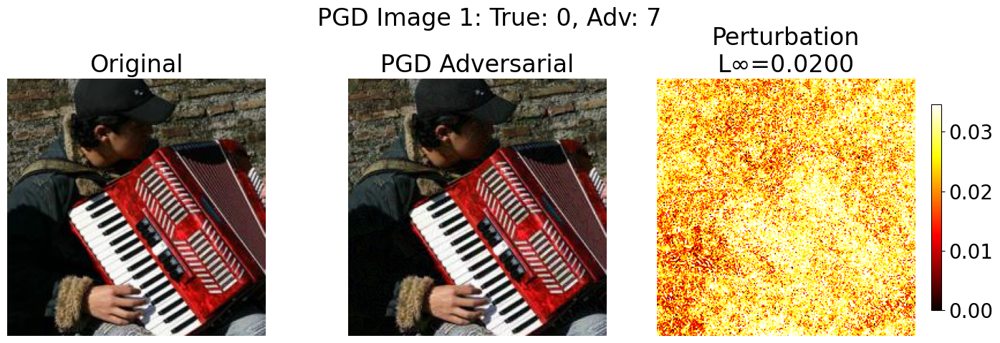

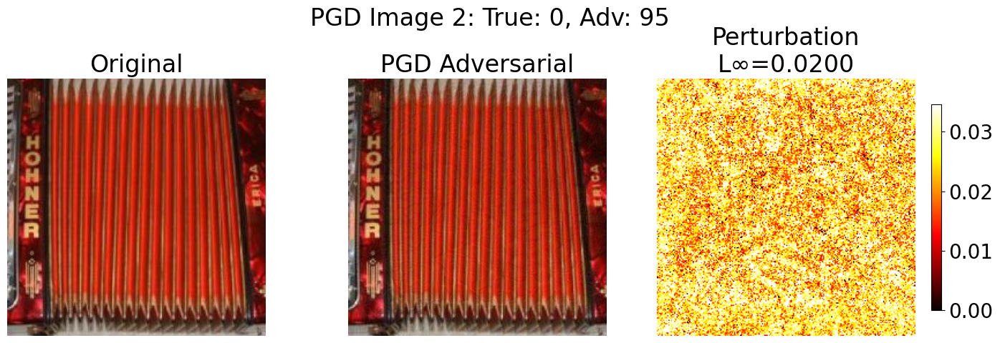

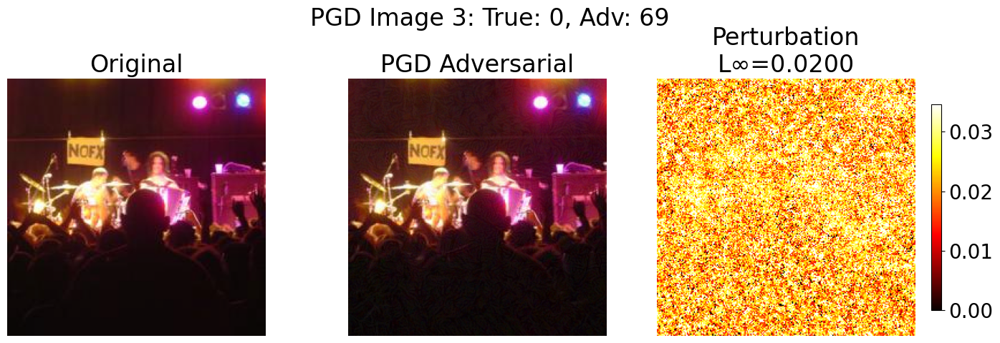

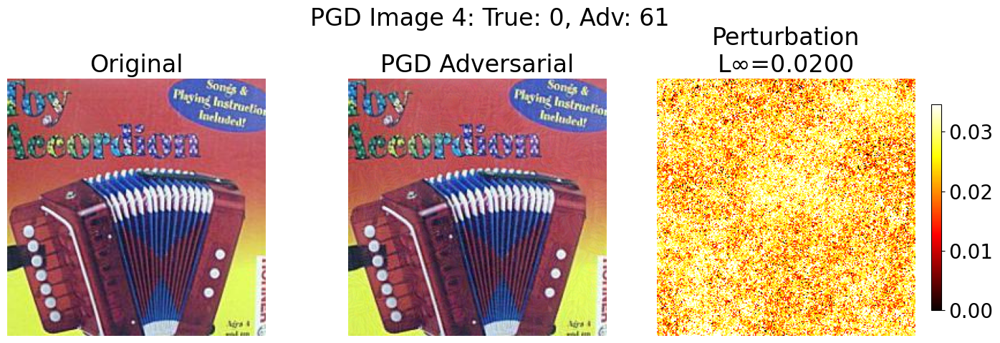

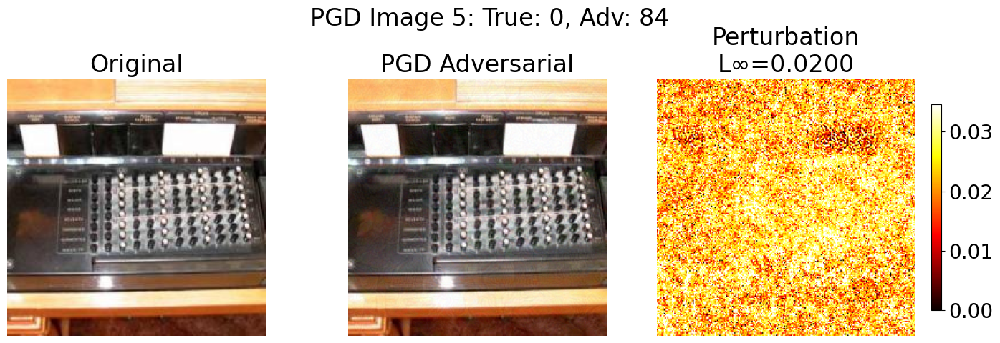

In [7]:
# Visualize misclassifications with perturbation analysis for PGD attack
print("\n🔍 Visualizing PGD misclassified samples with perturbation analysis:")
misclassified = (adv_labels != true_labels).nonzero(as_tuple=True)[0]

# Set up matplotlib parameters for larger fonts
plt.rcParams.update({'font.size': 20})

# Create directory for saving plots
save_dir = "/content/drive/MyDrive/pgd_perturbation_analysis"
os.makedirs(save_dir, exist_ok=True)

for i, idx in enumerate(misclassified[:5]):
    orig = unnormalize(orig_images[idx]).permute(1, 2, 0).numpy()
    adv = unnormalize(adv_images[idx]).permute(1, 2, 0).numpy()

    # Calculate perturbation and L_inf norm
    perturbation = adv - orig
    l_inf_norm = np.max(np.abs(perturbation))

    # Calculate perturbation magnitude (pixel-wise L2 norm across channels)
    perturbation_magnitude = np.sqrt(np.sum(perturbation**2, axis=2))

    # Create figure with 3 subplots
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))

    # Plot original
    axs[0].imshow(np.clip(orig, 0, 1))
    axs[0].set_title("Original")
    axs[0].axis('off')  # Remove axes for cleaner look

    # Plot adversarial
    axs[1].imshow(np.clip(adv, 0, 1))
    axs[1].set_title("PGD Adversarial")
    axs[1].axis('off')

    # Plot perturbation heatmap
    perturbation_img = axs[2].imshow(perturbation_magnitude, cmap='hot')
    axs[2].set_title(f"Perturbation\nL∞={l_inf_norm:.4f}")
    axs[2].axis('off')
    fig.colorbar(perturbation_img, ax=axs[2], shrink=0.8)

    plt.suptitle(f"PGD Image {i+1}: True: {true_labels[idx].item()}, Adv: {adv_labels[idx].item()}")

    # Tight layout with minimal white space
    plt.tight_layout()
    plt.subplots_adjust(wspace=0.05)

    # Save as PNG and PDF with minimal white space
    plt.savefig(f"{save_dir}/pgd_perturbation_analysis_{i+1}.png", bbox_inches='tight', dpi=300)
    plt.savefig(f"{save_dir}/pgd_perturbation_analysis_{i+1}.pdf", bbox_inches='tight')

    plt.show()

    # Additionally save a figure showing just the perturbation at higher resolution
    plt.figure(figsize=(8, 8))
    plt.imshow(perturbation_magnitude, cmap='hot')
    plt.colorbar(label='Perturbation Magnitude')
    plt.title(f"PGD Perturbation (L∞={l_inf_norm:.4f})", fontsize=20)
    plt.axis('off')
    plt.tight_layout()
    plt.savefig(f"{save_dir}/pgd_perturbation_only_{i+1}.png", bbox_inches='tight', dpi=300)
    plt.savefig(f"{save_dir}/pgd_perturbation_only_{i+1}.pdf", bbox_inches='tight')
    plt.close()

#PART 4

🚀 Running mixed precision patch attack targeting both top-1 and top-5 accuracy...
Parameters: ε=0.5, patch_size=32, steps=150, restarts=10
Using automatic mixed precision for faster processing


100%|██████████| 500/500 [4:02:09<00:00, 29.06s/it]


✅ Adversarial images saved to: /content/drive/MyDrive/Adversarial_Test_Set_3



🔍 Visualizing examples where true class is removed from top-5:


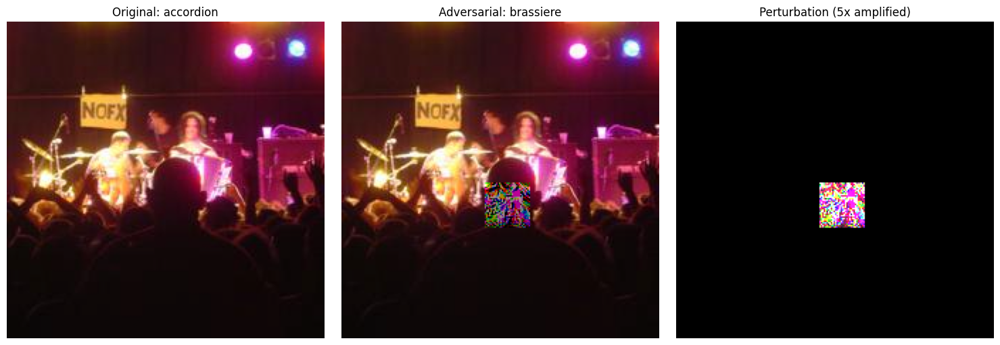

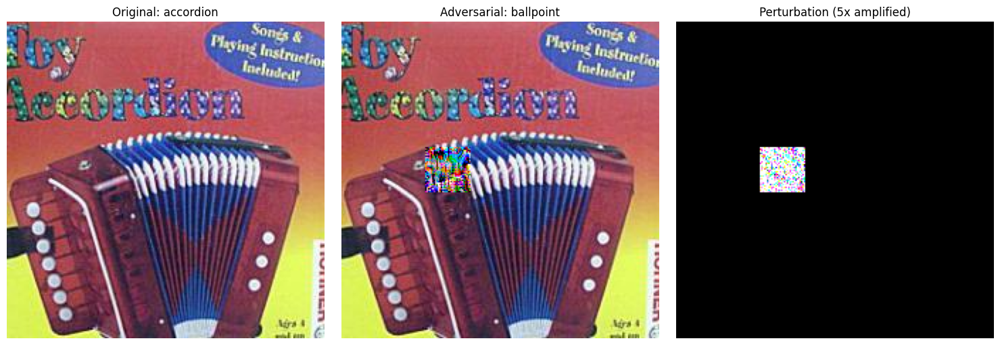

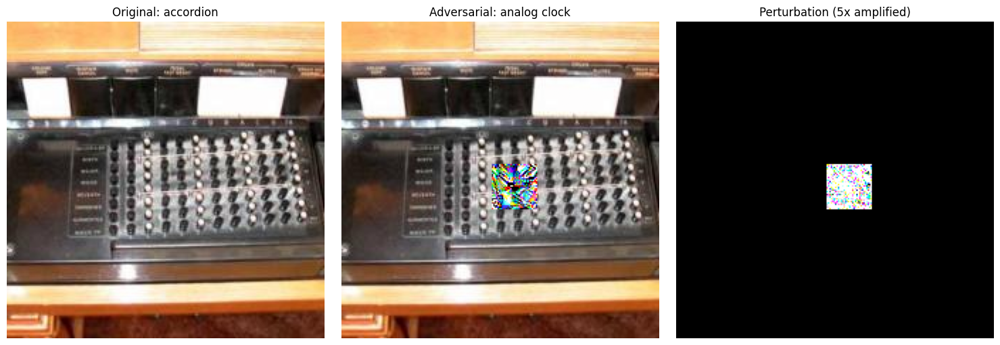

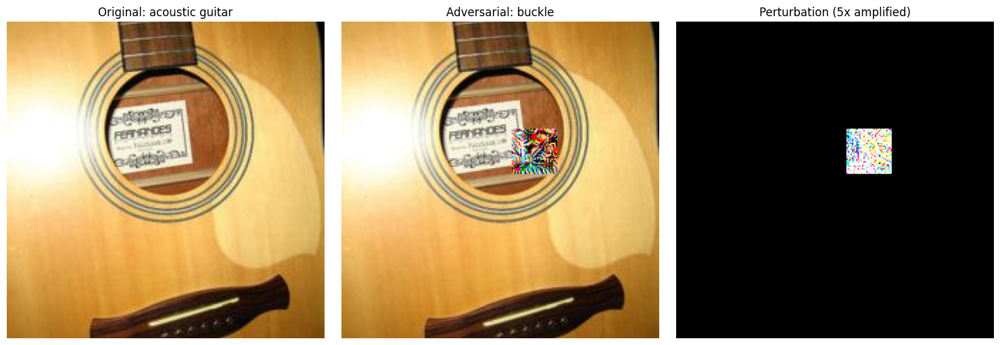

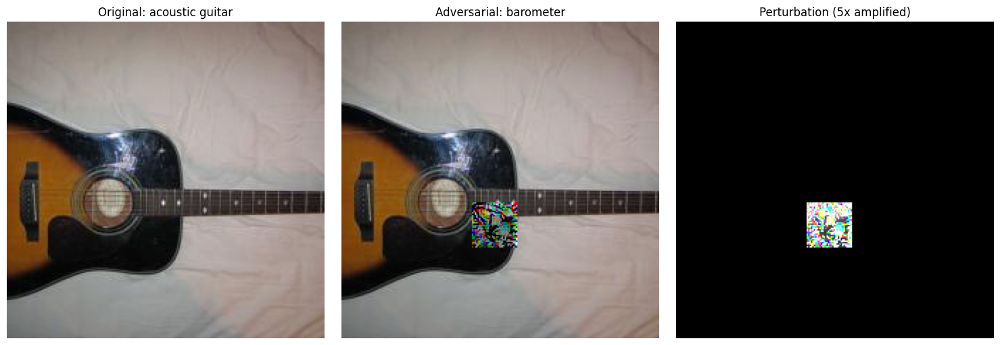


📊 Evaluating patch attack accuracy...

✅ Adversarial Test Set 3 (Patch attack with PGD, ε = 0.5)
Top-1 Accuracy: 0.20%
Top-5 Accuracy: 37.20%
Top-1 Attack Success Rate: 99.80%
Top-5 Attack Success Rate: 62.80%


In [7]:
import torch
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np
import json
import os
from tqdm import tqdm
from torchvision.utils import save_image
from PIL import Image
import random
from torch.cuda.amp import autocast, GradScaler

import warnings
warnings.filterwarnings("ignore")

# Load model
model = torchvision.models.resnet34(weights='IMAGENET1K_V1').cuda().eval()

# Load label indices
with open("/content/drive/MyDrive/TestDataSet/TestDataSet/labels_list.json", "r") as f:
    labels = json.load(f)
imagenet_indices = [int(x.split(":")[0]) for x in labels]
class_names = [x.split(":")[1].strip() for x in labels]

# Normalization
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])
normalize = transforms.Normalize(mean=mean, std=std)
unnormalize = transforms.Normalize(mean=-mean / std, std=1 / std)

to_tensor = transforms.ToTensor()

# Enhanced PGD patch parameters
epsilon = 0.5
alpha = 0.04
num_steps = 150
patch_size = 32
num_restarts = 10
num_target_classes = 12  # Target more classes to improve top-5 attack

# Dataset setup
root = "/content/drive/MyDrive/TestDataSet/TestDataSet"
dataset = torchvision.datasets.ImageFolder(root=root, transform=lambda x: x)

# Output dir
adv_save_dir = "/content/drive/MyDrive/Adversarial_Test_Set_3"
os.makedirs(adv_save_dir, exist_ok=True)

adv_images = []
orig_images = []
true_labels = []
adv_labels = []

print(f"🚀 Running mixed precision patch attack targeting both top-1 and top-5 accuracy...")
print(f"Parameters: ε={epsilon}, patch_size={patch_size}, steps={num_steps}, restarts={num_restarts}")
print(f"Using automatic mixed precision for faster processing")

# Initialize AMP gradient scaler
scaler = GradScaler()

for i, (img_pil, label) in enumerate(tqdm(dataset)):

    raw = to_tensor(img_pil).unsqueeze(0).cuda()
    orig = raw.clone()
    _, _, H, W = raw.shape

    # Create patch mask with center bias
    patch_mask = torch.zeros_like(raw)

    # Single patch - biased toward center
    center_x, center_y = W//2, H//2
    max_offset = min(W, H)//6  # Tighter center focus
    x = center_x + random.randint(-max_offset, max_offset) - patch_size//2
    y = center_y + random.randint(-max_offset, max_offset) - patch_size//2
    x = max(0, min(W-patch_size, x))
    y = max(0, min(H-patch_size, y))
    patch_mask[:, :, y:y+patch_size, x:x+patch_size] = 1.0

    best_adv = orig.clone()
    best_dual_score = torch.tensor(-float("inf")).cuda()

    # Find initial prediction to identify promising target classes
    with torch.no_grad(), autocast():
        initial_output = model(normalize(orig))[:, imagenet_indices]
        initial_probs = torch.softmax(initial_output.squeeze(), dim=0)

        # Get all classes except the true class
        all_classes = torch.arange(len(imagenet_indices), device='cuda')
        wrong_classes = all_classes[all_classes != label]

        # Get top predicted classes excluding true class
        initial_probs_clone = initial_probs.clone()
        initial_probs_clone[label] = 0  # Zero out true class
        confusing_classes = initial_probs_clone.argsort(descending=True)[:num_target_classes]

    # Initialize momentum
    momentum = torch.zeros_like(orig).cuda()

    for restart in range(num_restarts):
        # Different strategies for different restarts
        if restart < num_restarts // 2:
            # First half of restarts: target most confusing classes
            target_classes = confusing_classes
        else:
            # Second half: randomly sample from all wrong classes for diversity
            perm = torch.randperm(len(wrong_classes), device='cuda')
            target_classes = wrong_classes[perm[:num_target_classes]]

        # Learning rate schedule
        alpha_schedule = lambda step: alpha * (1.0 - 0.8 * (step/num_steps))

        # Initialize with random noise in patch area
        rand_noise = torch.empty_like(raw).uniform_(-epsilon, epsilon) * patch_mask
        perturbed = torch.clamp(orig + rand_noise, 0, 1).detach().requires_grad_(True)

        # Reset momentum for each restart
        momentum = torch.zeros_like(orig).cuda()

        for step in range(num_steps):
            # Current alpha value
            current_alpha = alpha_schedule(step)

            # Forward pass with mixed precision
            with autocast():
                normed = normalize(perturbed)
                output = model(normed)
                masked_output = output[:, imagenet_indices]

                # Get probability distribution
                probs = torch.softmax(masked_output.squeeze(), dim=0)

                # Calculate margins for targeted classes vs true class
                margins = []
                for target_idx in target_classes:
                    margin = probs[target_idx] - probs[label]
                    margins.append(margin)

                # Sort margins to get the 5th best
                margins = torch.stack(margins)
                margins_sorted, _ = torch.sort(margins, descending=True)

                # Fifth margin is key for pushing out of top-5
                fifth_margin = margins_sorted[min(4, len(margins_sorted)-1)]

                # Top-1 component (strongest wrong class)
                top1_margin = margins_sorted[0]

                # Combined loss with emphasis on top-5
                loss = -(0.3 * top1_margin + 0.7 * fifth_margin)

            # Compute gradient with AMP
            model.zero_grad()
            scaler.scale(loss).backward()

            # Apply momentum to gradient (in full precision)
            grad = perturbed.grad.detach()
            momentum = 0.9 * momentum - 0.1 * grad

            # Normalize gradient
            momentum_norm = momentum / (momentum.abs().mean(dim=(1, 2, 3), keepdim=True) + 1e-8)

            # Update (always in full precision)
            update = current_alpha * momentum_norm.sign() * patch_mask
            perturbed = perturbed + update

            # Project back to epsilon-ball and valid image range
            delta = torch.clamp(perturbed - orig, min=-epsilon, max=epsilon) * patch_mask
            perturbed = torch.clamp(orig + delta, 0, 1).detach().requires_grad_(True)

        # Evaluate this restart
        with torch.no_grad(), autocast():
            normed_final = normalize(perturbed.detach())
            final_output = model(normed_final)[:, imagenet_indices]

            # Get top-5 predictions
            _, top5 = final_output.topk(5, dim=1)
            top5_flat = top5.view(-1)

            # Score based on top-1 and top-5 success
            top1_success = 1.0 if top5[0, 0] != label else 0.0
            top5_success = 1.0 if label not in top5_flat else 0.0

            # Combined score with emphasis on top-5
            dual_score = top1_success * 0.35 + top5_success * 0.65

            # Always take example with better score
            if dual_score > best_dual_score:
                best_dual_score = dual_score
                best_adv = perturbed.detach()

            # If tied on dual score, use margin-based selection
            elif dual_score == best_dual_score:
                # Check which example has better margins
                final_probs = torch.softmax(final_output.squeeze(), dim=0)

                # Get current fifth margin
                current_margins = []
                for target_idx in target_classes:
                    margin = final_probs[target_idx] - final_probs[label]
                    current_margins.append(margin)
                current_margins = torch.stack(current_margins)
                current_margins_sorted, _ = torch.sort(current_margins, descending=True)
                current_fifth_margin = current_margins_sorted[min(4, len(current_margins_sorted)-1)]

                # Get best example's fifth margin
                with autocast():
                    best_output = model(normalize(best_adv))[:, imagenet_indices]
                    best_probs = torch.softmax(best_output.squeeze(), dim=0)

                best_margins = []
                for target_idx in target_classes:
                    margin = best_probs[target_idx] - best_probs[label]
                    best_margins.append(margin)
                best_margins = torch.stack(best_margins)
                best_margins_sorted, _ = torch.sort(best_margins, descending=True)
                best_fifth_margin = best_margins_sorted[min(4, len(best_margins_sorted)-1)]

                # Take example with better fifth margin
                if current_fifth_margin > best_fifth_margin:
                    best_adv = perturbed.detach()

    # Save adversarial image
    save_path = os.path.join(adv_save_dir, f"adv_{i:04d}.png")
    save_image(best_adv.cpu().squeeze(), save_path)

    # Evaluation
    with torch.no_grad(), autocast():
        normed_adv = normalize(best_adv)
        pred = model(normed_adv)
        masked_pred = pred[:, imagenet_indices]
        pred_top1 = masked_pred.argmax(dim=1)

    adv_images.append(normed_adv.cpu())
    orig_images.append(normalize(orig).cpu())
    true_labels.append(label)
    adv_labels.append(pred_top1.item())



print("✅ Adversarial images saved to:", adv_save_dir)

# Convert lists to tensors
adv_images = torch.cat(adv_images)
orig_images = torch.cat(orig_images)
true_labels = torch.tensor(true_labels)
adv_labels = torch.tensor(adv_labels)

# Visualize examples - focusing on top-5 removal
print("\n🔍 Visualizing examples where true class is removed from top-5:")

success_indices = []
with torch.no_grad(), autocast():
    for i in range(len(adv_images)):
        batch = adv_images[i].unsqueeze(0).cuda()
        target = true_labels[i].cuda()
        outputs = model(batch)
        masked_outputs = outputs[:, imagenet_indices]

        _, top5 = masked_outputs.topk(5, dim=1)

        # Check if true class is NOT in top-5
        if target not in top5[0]:
            success_indices.append(i)
            if len(success_indices) >= 5:  # Get first 5 successful examples
                break

# If we don't have enough top-5 successes, fall back to top-1 misclassifications
if len(success_indices) < 5:
    misclassified = (adv_labels != true_labels).nonzero(as_tuple=True)[0]
    remaining_needed = 5 - len(success_indices)
    for i in misclassified:
        if i not in success_indices:
            success_indices.append(i)
            remaining_needed -= 1
            if remaining_needed == 0:
                break

# Visualize examples
for i in success_indices[:5]:
    orig = unnormalize(orig_images[i]).permute(1, 2, 0).numpy()
    adv = unnormalize(adv_images[i]).permute(1, 2, 0).numpy()
    diff = np.abs(adv - orig) * 5  # Amplify difference to visualize patch

    # Get model predictions
    with torch.no_grad(), autocast():
        # Original image
        orig_output = model(orig_images[i].unsqueeze(0).cuda())
        orig_masked = orig_output[:, imagenet_indices]
        _, orig_top5 = orig_masked.topk(5, dim=1)
        orig_top5_labels = [class_names[idx] for idx in orig_top5[0].cpu().numpy()]

        # Adversarial image
        adv_output = model(adv_images[i].unsqueeze(0).cuda())
        adv_masked = adv_output[:, imagenet_indices]
        _, adv_top5 = adv_masked.topk(5, dim=1)
        adv_top5_labels = [class_names[idx] for idx in adv_top5[0].cpu().numpy()]

    fig, axs = plt.subplots(1, 3, figsize=(15, 5))

    axs[0].imshow(np.clip(orig, 0, 1))
    axs[0].set_title(f"Original: {class_names[true_labels[i]]}")
    axs[0].set_xlabel(f"Top-5: {', '.join(orig_top5_labels)}")
    axs[0].axis('off')

    axs[1].imshow(np.clip(adv, 0, 1))
    axs[1].set_title(f"Adversarial: {class_names[adv_labels[i]]}")
    axs[1].set_xlabel(f"Top-5: {', '.join(adv_top5_labels)}")
    axs[1].axis('off')

    plt.tight_layout()
    plt.savefig(os.path.join(adv_save_dir, f"example_{i:04d}.png"))
    plt.show()

# Evaluate accuracy
print("\n📊 Evaluating patch attack accuracy...")

top1_correct, top5_correct = 0, 0
total = 0

with torch.no_grad(), autocast():
    for i in range(0, len(adv_images), 64):
        batch = adv_images[i:i+64].cuda()
        targets = true_labels[i:i+64].cuda()
        outputs = model(batch)
        masked_outputs = outputs[:, imagenet_indices]

        _, top5 = masked_outputs.topk(5, dim=1)
        top1 = top5[:, 0]

        top1_correct += (top1 == targets).sum().item()
        top5_correct += sum([targets[j] in top5[j] for j in range(len(targets))])
        total += targets.size(0)

adv_top1_acc = top1_correct / total
adv_top5_acc = top5_correct / total

# Calculate attack success rates
top1_success_rate = 1 - adv_top1_acc
top5_success_rate = 1 - adv_top5_acc

print(f"\n✅ Adversarial Test Set 3 (Patch attack with PGD, ε = {epsilon})")
print(f"Top-1 Accuracy: {adv_top1_acc * 100:.2f}%")
print(f"Top-5 Accuracy: {adv_top5_acc * 100:.2f}%")

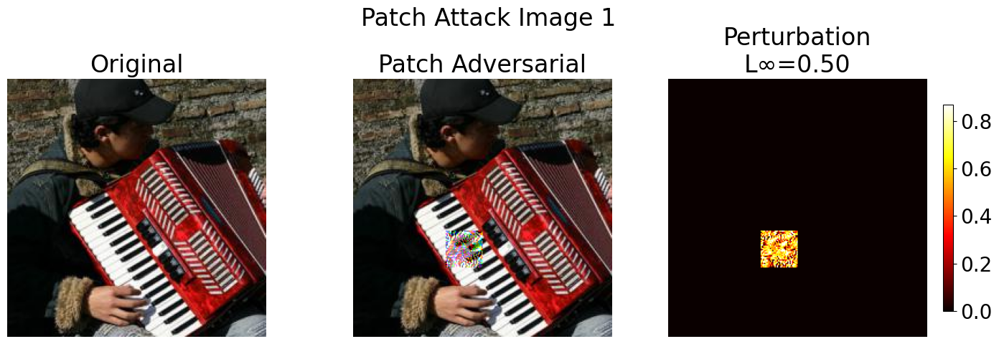

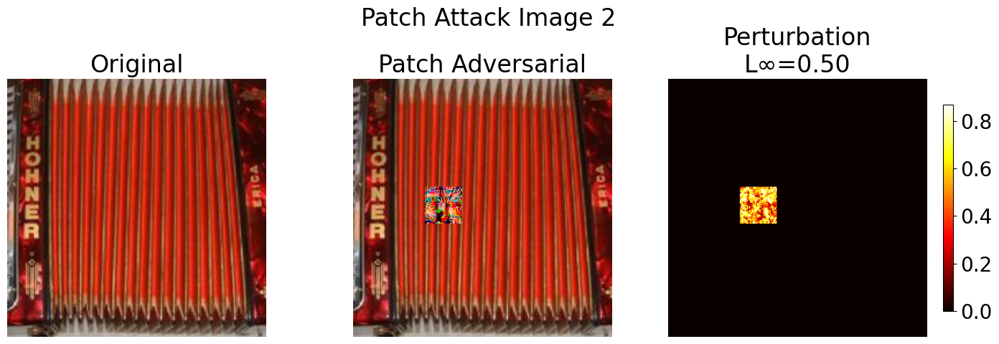

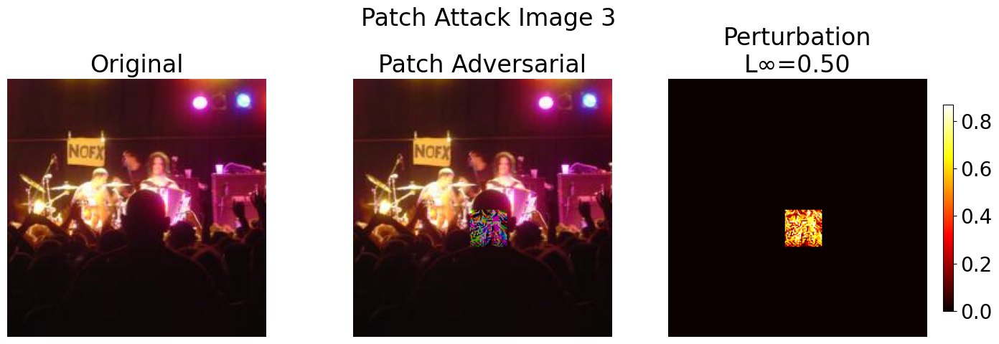

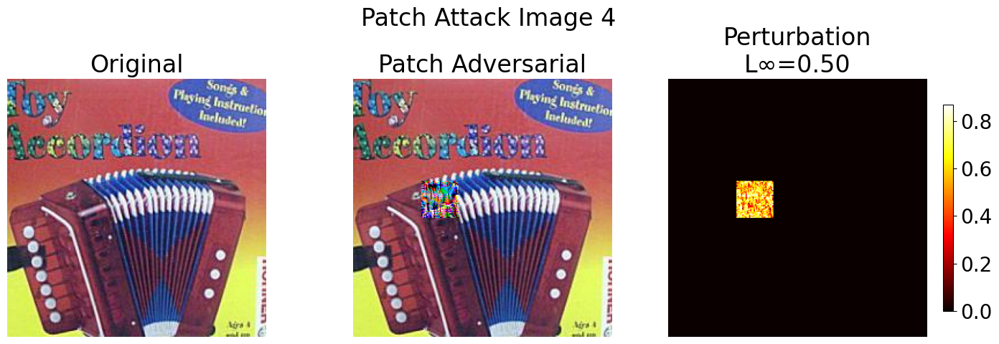

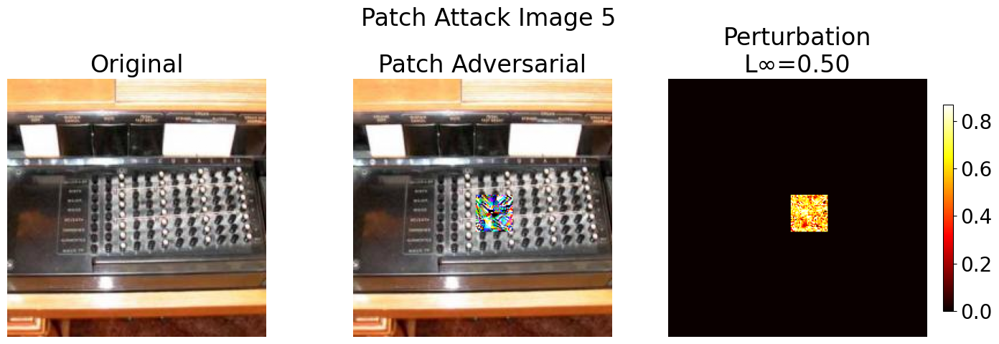

In [9]:
import torch
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np
import json
import os
from PIL import Image
import glob

# Set font size for plots
plt.rcParams.update({'font.size': 20})

# Normalization parameters (same as in the attack code)
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])
normalize = transforms.Normalize(mean=mean, std=std)
unnormalize = transforms.Normalize(mean=-mean / std, std=1 / std)
to_tensor = transforms.ToTensor()

# Paths
root = "/content/drive/MyDrive/TestDataSet/TestDataSet"  # Original dataset
adv_dir = "/content/drive/MyDrive/Adversarial_Test_Set_3"  # Adversarial images
save_dir = "/content/drive/MyDrive/patch_perturbation_analysis"  # Output directory
os.makedirs(save_dir, exist_ok=True)

# Load label indices
with open("/content/drive/MyDrive/TestDataSet/TestDataSet/labels_list.json", "r") as f:
    labels = json.load(f)
class_names = [x.split(":")[1].strip() for x in labels]

# Get dataset folder structure to match original images with adversarial ones
dataset = torchvision.datasets.ImageFolder(root=root, transform=lambda x: x)
img_paths = [sample[0] for sample in dataset.samples]
labels = [sample[1] for sample in dataset.samples]

# Get all adversarial images
adv_files = sorted(glob.glob(os.path.join(adv_dir, "adv_*.png")))

# Analyze the first 5 examples
for i in range(min(5, len(adv_files))):
    # Load adversarial image
    adv_path = adv_files[i]
    adv_idx = int(os.path.basename(adv_path).split('_')[1].split('.')[0])
    adv_img = Image.open(adv_path)
    adv_tensor = to_tensor(adv_img)

    # Load corresponding original image
    orig_path = img_paths[adv_idx]
    orig_img = Image.open(orig_path)
    orig_tensor = to_tensor(orig_img)

    # Convert to numpy for visualization
    orig_np = orig_tensor.permute(1, 2, 0).numpy()
    adv_np = adv_tensor.permute(1, 2, 0).numpy()

    # Calculate perturbation and L_inf norm
    perturbation = adv_np - orig_np
    l_inf_norm = np.max(np.abs(perturbation))

    # Calculate perturbation magnitude (pixel-wise L2 norm across channels)
    perturbation_magnitude = np.sqrt(np.sum(perturbation**2, axis=2))

    # Create figure with 3 subplots
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))

    # Plot original
    axs[0].imshow(np.clip(orig_np, 0, 1))
    axs[0].set_title("Original")
    axs[0].axis('off')  # Remove axes for cleaner look

    # Plot adversarial
    axs[1].imshow(np.clip(adv_np, 0, 1))
    axs[1].set_title("Patch Adversarial")
    axs[1].axis('off')

    # Plot perturbation heatmap - updated to 2 decimal places
    perturbation_img = axs[2].imshow(perturbation_magnitude, cmap='hot')
    axs[2].set_title(f"Perturbation\nL∞={l_inf_norm:.2f}")
    axs[2].axis('off')
    fig.colorbar(perturbation_img, ax=axs[2], shrink=0.8)

    plt.suptitle(f"Patch Attack Image {i+1}")

    # Tight layout with minimal white space
    plt.tight_layout()
    plt.subplots_adjust(wspace=0.05)

    # Save as PNG and PDF with minimal white space
    plt.savefig(f"{save_dir}/patch_perturbation_analysis_{i+1}.png", bbox_inches='tight', dpi=300)
    plt.savefig(f"{save_dir}/patch_perturbation_analysis_{i+1}.pdf", bbox_inches='tight')

    plt.show()

    # Create zoomed-in view of the perturbation (focused on the patch)
    plt.figure(figsize=(10, 8))

    # Find the patch area (where perturbation is non-zero)
    mask = perturbation_magnitude > 0.01  # Threshold to identify the patch
    if mask.sum() > 0:  # If perturbation is detected
        # Get bounding box of the patch with some padding
        y_indices, x_indices = np.where(mask)
        y_min, y_max = max(0, np.min(y_indices) - 10), min(mask.shape[0], np.max(y_indices) + 10)
        x_min, x_max = max(0, np.min(x_indices) - 10), min(mask.shape[1], np.max(x_indices) + 10)

        # Create zoomed view
        plt.imshow(perturbation_magnitude, cmap='hot')
        plt.xlim(x_min, x_max)
        plt.ylim(y_max, y_min)  # Reversed y-axis for correct orientation
    else:
        plt.imshow(perturbation_magnitude, cmap='hot')

    plt.colorbar(label='Perturbation Magnitude')
    # Updated to 2 decimal places
    plt.title(f"Zoomed Patch Perturbation\nL∞={l_inf_norm:.2f}", fontsize=20)
    plt.axis('off')
    plt.tight_layout()

    # Save zoomed view
    plt.savefig(f"{save_dir}/patch_perturbation_zoom_{i+1}.png", bbox_inches='tight', dpi=300)
    plt.savefig(f"{save_dir}/patch_perturbation_zoom_{i+1}.pdf", bbox_inches='tight')
    plt.close()

    # Create a 3D visualization of the perturbation
    from mpl_toolkits.mplot3d import Axes3D

    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')

    # Create meshgrid for 3D plot
    y, x = np.mgrid[0:perturbation_magnitude.shape[0], 0:perturbation_magnitude.shape[1]]

    # Subsample for better performance
    stride = 5

    # Plot the surface
    surf = ax.plot_surface(x[::stride, ::stride],
                           y[::stride, ::stride],
                           perturbation_magnitude[::stride, ::stride],
                           cmap='hot', linewidth=0)

    fig.colorbar(surf, ax=ax, shrink=0.5, aspect=5)
    # Updated to 2 decimal places
    ax.set_title(f"3D Perturbation Visualization\nL∞={l_inf_norm:.2f}")
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Perturbation Magnitude')

    # Save 3D visualization
    plt.savefig(f"{save_dir}/patch_perturbation_3d_{i+1}.png", bbox_inches='tight', dpi=300)
    plt.savefig(f"{save_dir}/patch_perturbation_3d_{i+1}.pdf", bbox_inches='tight')
    plt.close()

In [ ]:
import os
import json
import torch
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
from PIL import Image
from tqdm import tqdm

# Load label list and mapping
with open("/content/drive/MyDrive/TestDataSet/TestDataSet/labels_list.json", "r") as f:
    labels = json.load(f)
imagenet_indices = [int(l.split(":")[0]) for l in labels]

# Load original dataset to retrieve image-label pairs
original_dataset = torchvision.datasets.ImageFolder(
    root="/content/drive/MyDrive/TestDataSet/TestDataSet",
    transform=transforms.ToTensor()
)
original_label_map = [label for _, label in original_dataset.samples]

# Transforms
mean_norms = [0.485, 0.456, 0.406]
std_norms = [0.229, 0.224, 0.225]
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=mean_norms, std=std_norms)
])

# Custom dataset for flat PNGs
class AdversarialFlatDataset(Dataset):
    def __init__(self, img_dir, label_map, transform=None):
        self.img_dir = img_dir
        self.img_paths = sorted([f for f in os.listdir(img_dir) if f.endswith(".png")])
        self.transform = transform
        self.label_map = label_map  # List of int labels

    def __len__(self):
        return len(self.img_paths)

    def __getitem__(self, idx):
        img_path = os.path.join(self.img_dir, self.img_paths[idx])
        image = Image.open(img_path).convert("RGB")
        label = self.label_map[idx]  # same order as original dataset
        if self.transform:
            image = self.transform(image)
        return image, label

# Model: DenseNet-121
model = torchvision.models.densenet121(weights='IMAGENET1K_V1').cuda().eval()

# Dataset paths
dataset_paths = {
    "Original": "/content/drive/MyDrive/TestDataSet/TestDataSet",
    "Adversarial Set 1": "/content/drive/MyDrive/Adversarial_Test_Set_1",
    "Adversarial Set 2": "/content/drive/MyDrive/Adversarial_Test_Set_2",
    "Adversarial Set 3": "/content/drive/MyDrive/Adversarial_Test_Set_3",
}

results = {}

# Evaluate each dataset
for name, path in dataset_paths.items():
    print(f"\nEvaluating {name}")

    if "Adversarial" in name:
        dataset = AdversarialFlatDataset(path, original_label_map, transform=transform)
    else:
        dataset = torchvision.datasets.ImageFolder(root=path, transform=transform)

    loader = DataLoader(dataset, batch_size=64, shuffle=False, num_workers=4)

    top1_correct = 0
    top5_correct = 0
    total = 0

    with torch.no_grad():
        for images, targets in tqdm(loader):
            images, targets = images.cuda(), targets.cuda()
            outputs = model(images)
            masked_outputs = outputs[:, imagenet_indices]

            _, top5 = masked_outputs.topk(5, dim=1)
            top1 = top5[:, 0]

            top1_correct += (top1 == targets).sum().item()
            top5_correct += sum([targets[i] in top5[i] for i in range(len(targets))])
            total += targets.size(0)

    results[name] = {
        "Top-1 Accuracy": round(100 * top1_correct / total, 2),
        "Top-5 Accuracy": round(100 * top5_correct / total, 2)
    }

# Print summary
print("\n📊 Final Transferability Results (DenseNet-121):")
for name, metrics in results.items():
    print(f"{name}: Top-1 = {metrics['Top-1 Accuracy']}%, Top-5 = {metrics['Top-5 Accuracy']}%")


In [10]:
import os
import json
import torch
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
from PIL import Image
from tqdm import tqdm
import re

# Load label list and mapping
with open("/content/drive/MyDrive/TestDataSet/TestDataSet/labels_list.json", "r") as f:
    labels = json.load(f)
imagenet_indices = [int(l.split(":")[0]) for l in labels]
class_names = [l.split(":")[1].strip() for l in labels]

# Transforms
mean_norms = [0.485, 0.456, 0.406]
std_norms = [0.229, 0.224, 0.225]
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=mean_norms, std=std_norms)
])

# Get original dataset labels - we need to maintain the same order
original_dataset = torchvision.datasets.ImageFolder(
    root="/content/drive/MyDrive/TestDataSet/TestDataSet",
    transform=None  # No transform needed, just for labels
)

# Store the filename to label mapping
filename_to_label = {}
for path, label in original_dataset.samples:
    filename = os.path.basename(path)
    # Extract the base filename without extension
    base_name = os.path.splitext(filename)[0]
    # Store either as base name or with index (depending on your filename format)
    filename_to_label[base_name] = label
    # Also store with index, in case adversarial images use a different naming scheme
    match = re.search(r'(\d+)', base_name)
    if match:
        idx = int(match.group(1))
        filename_to_label[str(idx)] = label
        filename_to_label[f"adv_{idx:04d}"] = label
        filename_to_label[f"adv_{idx}"] = label

print(f"Original dataset size: {len(original_dataset)}")

# Custom dataset for flat PNGs with robust label matching
class AdversarialFlatDataset(Dataset):
    def __init__(self, img_dir, filename_to_label_map, transform=None):
        self.img_dir = img_dir
        self.img_paths = sorted([f for f in os.listdir(img_dir) if f.endswith(".png")])
        self.transform = transform
        self.filename_to_label_map = filename_to_label_map

        # Verify we can map all images to labels
        self.labels = []
        missed_files = []

        for img_file in self.img_paths:
            # Try various ways to match the filename to a label
            base_name = os.path.splitext(img_file)[0]
            label = None

            # Direct match
            if base_name in self.filename_to_label_map:
                label = self.filename_to_label_map[base_name]
            # Extract number and try matching
            else:
                match = re.search(r'(\d+)', base_name)
                if match:
                    idx = match.group(1)
                    if idx in self.filename_to_label_map:
                        label = self.filename_to_label_map[idx]
                    elif idx.lstrip('0') in self.filename_to_label_map:
                        label = self.filename_to_label_map[idx.lstrip('0')]

            if label is not None:
                self.labels.append(label)
            else:
                missed_files.append(img_file)

        if missed_files:
            print(f"Warning: Could not map {len(missed_files)} files to labels.")
            print(f"First few missed files: {missed_files[:5]}")

            # Fall back to using indices if all files have numeric patterns
            if len(missed_files) == len(self.img_paths):
                print("Falling back to direct index mapping...")
                # Extract numbers from filenames and sort
                ordered_samples = []
                for img_file in self.img_paths:
                    match = re.search(r'(\d+)', img_file)
                    if match:
                        idx = int(match.group(1))
                        ordered_samples.append((img_file, idx))

                ordered_samples.sort(key=lambda x: x[1])
                self.img_paths = [item[0] for item in ordered_samples]

                # Assume the labels are in the same order as original dataset
                if len(self.img_paths) <= len(original_dataset):
                    self.labels = [label for _, label in original_dataset.samples][:len(self.img_paths)]
                    print(f"Successfully mapped {len(self.labels)} images using index order.")
                else:
                    raise ValueError("More adversarial images than original dataset images!")

        print(f"Dataset at {img_dir}: {len(self.labels)} images with labels")

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        img_path = os.path.join(self.img_dir, self.img_paths[idx])
        image = Image.open(img_path).convert("RGB")
        label = self.labels[idx]
        if self.transform:
            image = self.transform(image)
        return image, label

# Model: DenseNet-121
print("Loading DenseNet-121 model...")
model = torchvision.models.densenet121(weights='IMAGENET1K_V1').cuda().eval()

# Dataset paths
dataset_paths = {
    "Original": "/content/drive/MyDrive/TestDataSet/TestDataSet",
    "Adversarial Set 1": "/content/drive/MyDrive/Adversarial_Test_Set_1",
    "Adversarial Set 2": "/content/drive/MyDrive/Adversarial_Test_Set_2",
    "Adversarial Set 3": "/content/drive/MyDrive/Adversarial_Test_Set_3",
}

results = {}

# Evaluate each dataset
for name, path in dataset_paths.items():
    print(f"\nEvaluating {name}")

    if "Adversarial" in name:
        dataset = AdversarialFlatDataset(path, filename_to_label, transform=transform)
    else:
        dataset = torchvision.datasets.ImageFolder(root=path, transform=transform)

    loader = DataLoader(dataset, batch_size=64, shuffle=False, num_workers=0)  # Set num_workers=0 to debug more easily

    top1_correct = 0
    top5_correct = 0
    total = 0

    with torch.no_grad():
        for images, targets in tqdm(loader):
            images, targets = images.cuda(), targets.cuda()
            outputs = model(images)
            masked_outputs = outputs[:, imagenet_indices]

            _, top5 = masked_outputs.topk(5, dim=1)
            top1 = top5[:, 0]

            top1_correct += (top1 == targets).sum().item()
            top5_correct += sum([targets[i] in top5[i] for i in range(len(targets))])
            total += targets.size(0)

    results[name] = {
        "Top-1 Accuracy": round(100 * top1_correct / total, 2),
        "Top-5 Accuracy": round(100 * top5_correct / total, 2)
    }

# Print summary
print("\n📊 Final Transferability Results (DenseNet-121):")
for name, metrics in results.items():
    print(f"{name}: Top-1 = {metrics['Top-1 Accuracy']}%, Top-5 = {metrics['Top-5 Accuracy']}%")

# Print attack effectiveness
print("\n💥 Attack Effectiveness:")
original_metrics = results["Original"]
for name, metrics in results.items():
    if name != "Original":
        top1_reduction = original_metrics["Top-1 Accuracy"] - metrics["Top-1 Accuracy"]
        top5_reduction = original_metrics["Top-5 Accuracy"] - metrics["Top-5 Accuracy"]
        print(f"{name}: Top-1 reduction = {top1_reduction:.2f}%, Top-5 reduction = {top5_reduction:.2f}%")

Original dataset size: 500
Loading DenseNet-121 model...

Evaluating Original


100%|██████████| 8/8 [00:03<00:00,  2.05it/s]



Evaluating Adversarial Set 1
First few missed files: ['adv_0000.png', 'adv_0001.png', 'adv_0002.png', 'adv_0003.png', 'adv_0004.png']
Falling back to direct index mapping...
Successfully mapped 500 images using index order.
Dataset at /content/drive/MyDrive/Adversarial_Test_Set_1: 500 images with labels


100%|██████████| 8/8 [00:05<00:00,  1.41it/s]



Evaluating Adversarial Set 2
First few missed files: ['adv_0000.png', 'adv_0001.png', 'adv_0002.png', 'adv_0003.png', 'adv_0004.png']
Falling back to direct index mapping...
Successfully mapped 500 images using index order.
Dataset at /content/drive/MyDrive/Adversarial_Test_Set_2: 500 images with labels


100%|██████████| 8/8 [00:05<00:00,  1.39it/s]



Evaluating Adversarial Set 3
First few missed files: ['adv_0000.png', 'adv_0001.png', 'adv_0002.png', 'adv_0003.png', 'adv_0004.png']
Falling back to direct index mapping...
Successfully mapped 500 images using index order.
Dataset at /content/drive/MyDrive/Adversarial_Test_Set_3: 500 images with labels


100%|██████████| 8/8 [00:05<00:00,  1.57it/s]


📊 Final Transferability Results (DenseNet-121):
Original: Top-1 = 88.0%, Top-5 = 98.4%
Adversarial Set 1: Top-1 = 62.4%, Top-5 = 89.4%
Adversarial Set 2: Top-1 = 65.6%, Top-5 = 93.8%
Adversarial Set 3: Top-1 = 85.2%, Top-5 = 98.0%

💥 Attack Effectiveness:
Adversarial Set 1: Top-1 reduction = 25.60%, Top-5 reduction = 9.00%
Adversarial Set 2: Top-1 reduction = 22.40%, Top-5 reduction = 4.60%
Adversarial Set 3: Top-1 reduction = 2.80%, Top-5 reduction = 0.40%


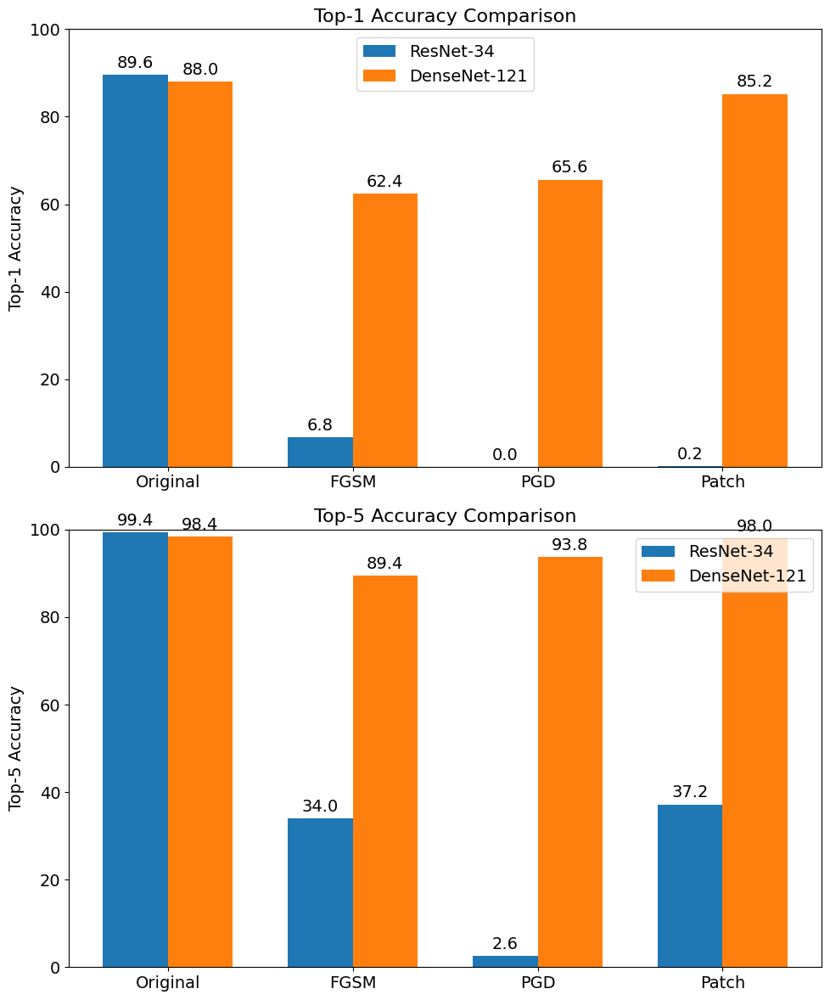

In [10]:
import matplotlib.pyplot as plt
import numpy as np

# Data from the table in Image 1
datasets = ['Clean', 'Adversarial Set 1', 'Adversarial Set 2', 'Adversarial Set 3']
datasets_short = ['Original', 'FGSM', 'PGD', 'Patch']

# Top-1 accuracies for both models
resnet34_top1 = [89.60, 6.80, 0.00, 0.20]
densenet121_top1 = [88.00, 62.40, 65.60, 85.20]

# Top-5 accuracies for both models
resnet34_top5 = [99.40, 34.00, 2.60, 37.20]
densenet121_top5 = [98.40, 89.40, 93.80, 98.00]

# Set up figure and font size
plt.rcParams.update({'font.size': 14})
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 12))

# Bar width and positions
width = 0.35
x = np.arange(len(datasets_short))

# Top-1 Accuracy plot
bars1 = ax1.bar(x - width/2, resnet34_top1, width, label='ResNet-34', color='#1f77b4')
bars2 = ax1.bar(x + width/2, densenet121_top1, width, label='DenseNet-121', color='#ff7f0e')

ax1.set_title('Top-1 Accuracy Comparison', fontsize=16)
ax1.set_ylabel('Top-1 Accuracy', fontsize=14)
ax1.set_xticks(x)
ax1.set_xticklabels(datasets_short)
ax1.set_ylim(0, 100)
ax1.legend()

# Add value labels on the bars for Top-1
for bar in bars1:
    height = bar.get_height()
    ax1.annotate(f'{height:.1f}',
                xy=(bar.get_x() + bar.get_width() / 2, height),
                xytext=(0, 3),
                textcoords="offset points",
                ha='center', va='bottom')

for bar in bars2:
    height = bar.get_height()
    ax1.annotate(f'{height:.1f}',
                xy=(bar.get_x() + bar.get_width() / 2, height),
                xytext=(0, 3),
                textcoords="offset points",
                ha='center', va='bottom')

# Top-5 Accuracy plot
bars3 = ax2.bar(x - width/2, resnet34_top5, width, label='ResNet-34', color='#1f77b4')
bars4 = ax2.bar(x + width/2, densenet121_top5, width, label='DenseNet-121', color='#ff7f0e')

ax2.set_title('Top-5 Accuracy Comparison', fontsize=16)
ax2.set_ylabel('Top-5 Accuracy', fontsize=14)
ax2.set_xticks(x)
ax2.set_xticklabels(datasets_short)
ax2.set_ylim(0, 100)
ax2.legend()

# Add value labels on the bars for Top-5
for bar in bars3:
    height = bar.get_height()
    ax2.annotate(f'{height:.1f}',
                xy=(bar.get_x() + bar.get_width() / 2, height),
                xytext=(0, 3),
                textcoords="offset points",
                ha='center', va='bottom')

for bar in bars4:
    height = bar.get_height()
    ax2.annotate(f'{height:.1f}',
                xy=(bar.get_x() + bar.get_width() / 2, height),
                xytext=(0, 3),
                textcoords="offset points",
                ha='center', va='bottom')

plt.tight_layout()

# Save both as PNG and PDF
plt.savefig('accuracy_comparison.png', dpi=300, bbox_inches='tight')
plt.savefig('accuracy_comparison.pdf', bbox_inches='tight')

plt.show()